
Paper:
[A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576).
*Leon A. Gatys, Alexander S. Ecker, Matthias Bethge*.

TF2 tutorial: [Neural style transfer](https://www.tensorflow.org/tutorials/generative/style_transfer)

TF1 tutorial: [LazyProgrammer's CNN class](https://github.com/lazyprogrammer/machine_learning_examples/blob/master/cnn_class2/style_transfer3.py)

Pytorch tutorial: [Neural transfer using pytorch](https://pytorch.org/tutorials/advanced/neural_style_tutorial.html)


In [ ]:
import tensorflow as tf

print("TF Version: ", tf.__version__)
print("GPU available: ", tf.config.list_physical_devices('GPU'))

TF Version:  2.9.2
GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Load content and style images

In [ ]:
# @title Define image loading and visualization functions  { display-mode: "form" }

# From: https://www.tensorflow.org/hub/tutorials/tf2_arbitrary_image_stylization

import os
from functools import lru_cache
import matplotlib.pyplot as plt
from matplotlib import gridspec
import PIL

def crop_center(image):
  """Returns a cropped square image."""
  shape = image.shape
  new_shape = min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  image = tf.image.crop_to_bounding_box(
      image, offset_y, offset_x, new_shape, new_shape)
  return image

@lru_cache(maxsize=None)
def load_image(image_url, image_size=(1024, 768), preserve_aspect_ratio=True):
  """Loads and preprocesses images."""
  # Cache image file locally if url is provided
  if os.path.isfile(image_url):
    image_path = image_url
  else:
    image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
  # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
  img = tf.io.decode_image(
      tf.io.read_file(image_path),
      channels=3, dtype=tf.float32)[tf.newaxis, ...]
  # Crop center if target image shape is square.
  if image_size[0] == image_size[1]:
    img = crop_center(img)
  # Swap target width and height if required.
  if (img.shape[1] < img.shape[2]) and (image_size[0] > image_size[1]):
    image_size = (image_size[1], image_size[0])
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

def show_n(images, titles=('',), ncols=None):
  # Recursive call to plot over multiple rows
  if ncols and ncols < len(images):
    nrows = len(images)//ncols + (len(images)%ncols>0)  # round-up integer division
    for row in range(nrows):
      l, r = ncols*row, min(ncols*(row+1), len(images))
      show_n(images[l:r], titles[l:r] if len(titles) > r-1 else ('',))
  # Plot on the same row
  else:
    n = len(images)
    image_sizes = [image.shape[1] for image in images]
    w = (image_sizes[0] * 6) // 320
    plt.figure(figsize=(w * n, w))
    gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
    for i in range(n):
      plt.subplot(gs[i])
      plt.imshow(images[i][0], aspect='equal')
      plt.axis('off')
      plt.title(titles[i] if len(titles) > i else '')
    plt.show()

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor) > 3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

Content images:


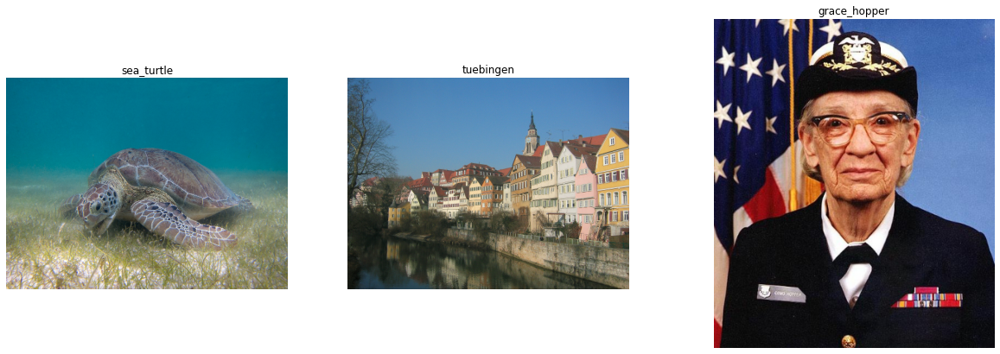

Style images:


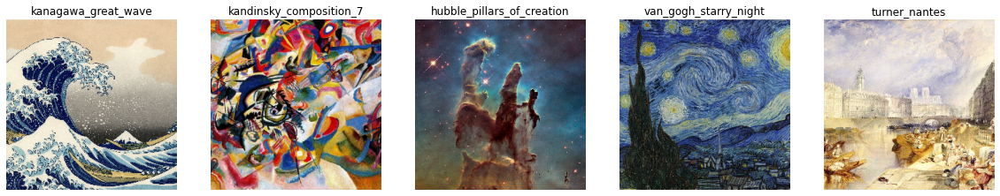

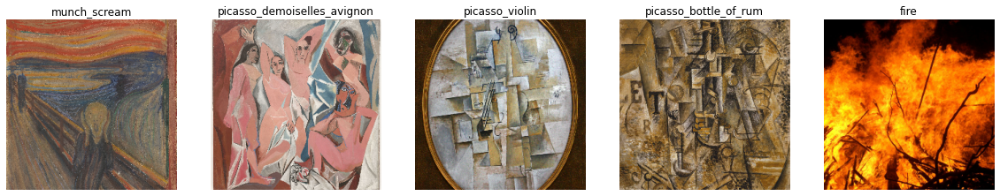

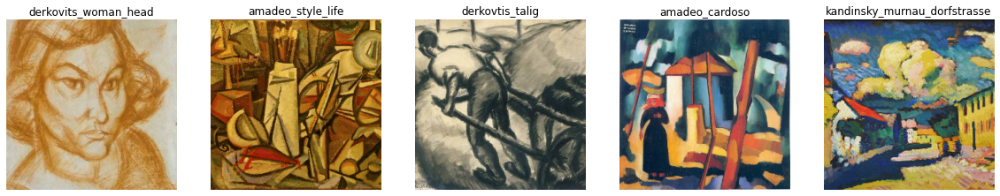

In [ ]:
# @title Load content and style images { display-mode: "form" }

content_urls = dict(
  sea_turtle='https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg',
  tuebingen='https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg',
  grace_hopper='https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg',
  )
style_urls = dict(
  kanagawa_great_wave='https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg',
  kandinsky_composition_7='https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
  hubble_pillars_of_creation='https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',
  van_gogh_starry_night='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
  turner_nantes='https://upload.wikimedia.org/wikipedia/commons/b/b7/JMW_Turner_-_Nantes_from_the_Ile_Feydeau.jpg',
  munch_scream='https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg',
  picasso_demoiselles_avignon='https://upload.wikimedia.org/wikipedia/en/4/4c/Les_Demoiselles_d%27Avignon.jpg',
  picasso_violin='https://upload.wikimedia.org/wikipedia/en/3/3c/Pablo_Picasso%2C_1911-12%2C_Violon_%28Violin%29%2C_oil_on_canvas%2C_Kr%C3%B6ller-M%C3%BCller_Museum%2C_Otterlo%2C_Netherlands.jpg',
  picasso_bottle_of_rum='https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg',
  fire='https://upload.wikimedia.org/wikipedia/commons/3/36/Large_bonfire.jpg',
  derkovits_woman_head='https://upload.wikimedia.org/wikipedia/commons/0/0d/Derkovits_Gyula_Woman_head_1922.jpg',
  amadeo_style_life='https://upload.wikimedia.org/wikipedia/commons/8/8e/Untitled_%28Still_life%29_%281913%29_-_Amadeo_Souza-Cardoso_%281887-1918%29_%2817385824283%29.jpg',
  derkovtis_talig='https://upload.wikimedia.org/wikipedia/commons/3/37/Derkovits_Gyula_Talig%C3%A1s_1920.jpg',
  amadeo_cardoso='https://upload.wikimedia.org/wikipedia/commons/7/7d/Amadeo_de_Souza-Cardoso%2C_1915_-_Landscape_with_black_figure.jpg',
  kandinsky_murnau_dorfstrasse='https://upload.wikimedia.org/wikipedia/commons/8/83/Vassily_Kandinsky%2C_1908%2C_Murnau%2C_Dorfstrasse.jpg'
)

# Limit image sizes to save computation time
content_image_width = 512  # @param {type:"integer"}
content_image_height = 384  # @param {type:"integer"}
style_image_size = 256  # @param {type:"integer"}
content_images = {k: load_image(v, (content_image_width, content_image_height)) for k, v in content_urls.items()}
style_images = {k: load_image(v, (style_image_size, style_image_size)) for k, v in style_urls.items()}

# Plot contents and styles
content_list = list(zip(*content_images.items()))
style_list = list(zip(*style_images.items()))
print("Content images:")
show_n(content_list[1], content_list[0], nrows=1)
print("Style images:")
show_n(style_list[1], style_list[0], nrows=3)

## (Playground: style transfer step by step)

In [ ]:
# @title Load a pre-trained classification model


from keras.applications.vgg19 import VGG19, preprocess_input

# Load a VGG19 without the classification head.
vgg = VGG19(include_top=False, weights='imagenet')
vgg.trainable = False

# Print the layer names.
layer_blocks = dict()
for layer in vgg.layers:
  name = layer.name
  block = layer.name.split("_")[0]
  if block != "input":
    layer_blocks[block] = layer_blocks.get(block, []) + [name]

print()
for block, layers in layer_blocks.items():
  print(block, ":", layers)

80134624/80134624 [==============================] - 1s 0us/step

block1 : ['block1_conv1', 'block1_conv2', 'block1_pool']
block2 : ['block2_conv1', 'block2_conv2', 'block2_pool']
block3 : ['block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_conv4', 'block3_pool']
block4 : ['block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_conv4', 'block4_pool']
block5 : ['block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4', 'block5_pool']


In [ ]:
# @title Define the content extractor and the style extractor

# Choose a deep layer from the network to represent the content of the image.
content_layer = 'block5_conv2'
content_extractor = tf.keras.Model(
  vgg.input,
  vgg.get_layer(content_layer).output
)
print("content layer: " + content_layer)

# Choose intermediate layers to represent the style of the image.
style_layers = [block[0] for block in layer_blocks.values()]
style_extractor = tf.keras.Model(
  vgg.input,
  [vgg.get_layer(name).output for name in style_layers]
)
print("style layers : " + ", ".join(style_layers))

content layer: block5_conv2
style layers : block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1


### Standalone Content replication

We define an helper function to extract the content of an image. The steps are `preprocess_input` and `content_extractor`.

In [ ]:
def extract_content(img):
  # preprocess_input expects pixels in range [0, 255]
  X = preprocess_input(255.0 * img)
  y = content_extractor(X)
  return y

We select a target content image, and we use `extract_content` to define a target content for the optimization problem.

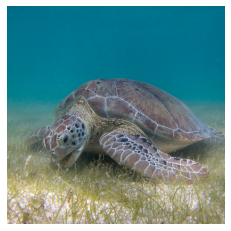

In [ ]:
# Select an image for the target content.
content_image = content_images['sea_turtle']
target_content = extract_content(content_image)

# We need the input shape to generate an initial random image to optimize.
input_shape = content_image.shape

# Plot target content image.
plt.imshow(content_image[0]); plt.axis('off');

We then initialize a random image and extract its content with `extract_content`. We then optimize the random image (not the model weights!) so that its content becomes similar to the target content, by minimizing the mean square error of the contents.

100%|██████████| 1000/1000 [01:26<00:00, 11.59it/s]


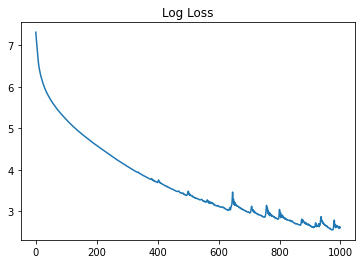


CPU times: user 1min 24s, sys: 379 ms, total: 1min 24s
Wall time: 1min 26s


(-0.5, 383.5, 383.5, -0.5)

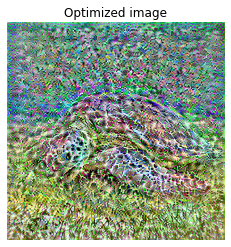

In [ ]:
%%time
from tqdm import tqdm
import numpy as np

EPOCHS = 1000
LEARNING_RATE = 1.

# Select optimizer
opt = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.99, epsilon=1e-1)

# Since we work with float images, pixel values must be in range (0,1).
# We define a function to clip the pixel values in range (0,1).
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0., clip_value_max=1.0)

# Define a tf.Variable with a random initial image to optimize.
X = tf.Variable(tf.random.uniform(input_shape))

# Optimization loop
losses = []
for epoch in tqdm(range(EPOCHS)):
  # We use tf.GradientTape for automatic differentiation.
  # We want to optimize X, not the model parameters, hence we set
  # watch_accessed_variables=False to ignore all model parameters.
  with tf.GradientTape(watch_accessed_variables=False) as tape:
    # Watch the input tensor for gradient calculations
    tape.watch(X)
    # Extract content of X
    y = extract_content(X)
    # Calculate content loss
    loss = tf.reduce_mean(tf.square(y - target_content))
    losses.append(loss.numpy())
  # Take the gradient with respect to the input tensor
  grad = tape.gradient(loss, X)
  # Backprop
  #X.assign_sub(LEARNING_RATE * grad)  # manual backprop
  opt.apply_gradients([(grad, X)])
  # Clip to keep pixel values in range
  X.assign(clip_0_1(X))

print()
plt.plot(np.log(losses)); plt.title("Log Loss"); plt.show();
print()
plt.imshow(X[0]); plt.title("Generated image"); plt.axis('off'); plt.show();

#### Experiment: optimize with L-BFGS

To minimize the loss function, we can use L-BFGS instead of gradient descent.

Issue: the `tfp.optimizer.lbfgs_minimize` implementation is too slow. TODO: try the scipy implementation.

In [ ]:
%%script false --no-raise-error

%%time
from tqdm import tqdm

# Initialize and preprocess random input
X = tf.Variable(tf.random.uniform(input_shape))

#Since this is a float image, define a function to keep the pixel values between 0 and 1:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0., clip_value_max=1.0)

def loss_fn(X):
  y = preprocess_input(255.0 * X)  # preprocess_input expects pixels in range [0,255]
  y = content_extractor(y)
  return tf.reduce_mean(tf.square(y - target_content))

# Function to return both loss and gradient with respect to X
def loss_and_grads(X):
  with tf.GradientTape(watch_accessed_variables=False) as tape:
    tape.watch(X)
    loss = loss_fn(X)
  grad = tape.gradient(loss, X)
  return loss, grad

# Train loop
EPOCHS = 10
losses = []
for epoch in tqdm(range(EPOCHS)):
  results = tfp.optimizer.lbfgs_minimize(
    loss_and_grads,
    initial_position=X,
    max_iterations=20)
  # After some iterations we clip X and we start a new eopch
  X.assign(clip_0_1(results.position))
  loss = loss_fn(X)  # or: loss = results.objective_value
  print(f" loss={loss:.0f}, iterations:{results.num_iterations}")
  losses.append(loss)

plt.plot(losses); plt.show()
plt.imshow(X[0]); plt.show()

##### Simple examples with `tfp.optimizer.lbfgs_minimize`

Tutorial: https://www.tensorflow.org/probability/examples/Optimizers_in_TensorFlow_Probability

In [ ]:
import tensorflow_probability as tfp
print("TFP Version: ", tfp.__version__)

# We minimize x**2
loss = lambda x: tf.reduce_sum(x**2)
results = tfp.optimizer.lbfgs_minimize(
  value_and_gradients_function=lambda x: tfp.math.value_and_gradient(loss, x),
  initial_position=tf.constant([2.]),
  max_iterations=50
)

print('Converged:', results.converged)
print('Minimum:', results.objective_value)
print('Location of the minimum:', results.position)
print('Number of iterations:', results.num_iterations)

TFP Version:  0.17.0
Converged: tf.Tensor(True, shape=(), dtype=bool)
Location of the minimum: tf.Tensor([0.], shape=(1,), dtype=float32)
Minimum: tf.Tensor(0.0, shape=(), dtype=float32)
Number of iterations: tf.Tensor(1, shape=(), dtype=int32)


In [ ]:
import numpy as np
# Fix numpy seed for reproducibility
np.random.seed(12345)

# The `make_val_and_grad_fn` decorator helps transforming a function
# returning the objective value into one that returns both the gradient
# and the value. It also works for both eager and graph mode.
import functools
def make_val_and_grad_fn(value_fn):
  @functools.wraps(value_fn)
  def val_and_grad(x):
    return tfp.math.value_and_gradient(value_fn, x)
  return val_and_grad

# The objective must be supplied as a function that takes a single
# (Tensor) argument and returns a tuple. The first component of the
# tuple is the value of the objective at the supplied point and the
# second value is the gradient at the supplied point. The value must
# be a scalar and the gradient must have the same shape as the
# supplied argument.

dim = 10
minimum = np.ones([dim])
scales = np.exp(np.random.randn(dim))

@make_val_and_grad_fn
def quadratic(x):
  return tf.reduce_sum(scales * (x - minimum) ** 2, axis=-1)

# The minimization routine also requires you to supply an initial
# starting point for the search. For this example we choose a random
# starting point.
start = np.random.randn(dim)

# Finally an optional argument called tolerance let's you choose the
# stopping point of the search. The tolerance specifies the maximum
# (supremum) norm of the gradient vector at which the algorithm terminates.
# If you don't have a specific need for higher or lower accuracy, leaving
# this parameter unspecified (and hence using the default value of 1e-8)
# should be good enough.
results = tfp.optimizer.lbfgs_minimize(
    quadratic,
    initial_position=tf.constant(start))

# The optimization results contain multiple pieces of information. The most
# important fields are: 'converged' and 'position'.
# Converged is a boolean scalar tensor. As the name implies, it indicates
# whether the norm of the gradient at the final point was within tolerance.
# Position is the location of the minimum found. It is important to check
# that converged is True before using the value of the position.

print('Converged:', results.converged)
print('Minimum:', results.objective_value)
print('Location of the minimum:', results.position)
print('Number of iterations:', results.num_iterations)


Converged: tf.Tensor(True, shape=(), dtype=bool)
Minimum: tf.Tensor(0.0, shape=(), dtype=float64)
Location of the minimum: tf.Tensor([1. 1. 1. 1. 1. 1. 1. 1. 1. 1.], shape=(10,), dtype=float64)
Number of iterations: tf.Tensor(10, shape=(), dtype=int32)


### Standalone Style replication

The style of an image can be described by the means and correlations across different feature maps. The Gram matrix includes this information by taking the outer product of the feature vector with itself at each location, and averaging that outer product over all locations. This Gram matrix can be calculated with `tf.linalg.einsum`.

In order to capture the style, we extract the feature maps and calculate their Gram matrix at different convolution layers of the neural network, and then we average over the layers.

We define an helper function to extract the style of an image. The steps are `preprocess_input`, `style_extractor`, and `gram_matrix`. The output is a list, since it includes an output for each of the `style_layers`.

In [ ]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result / num_locations

def extract_style(img):
  # preprocess_input expects pixels in range [0, 255]
  X = preprocess_input(255.0 * img)
  Y = style_extractor(X)
  Y = [gram_matrix(style_output) for style_output in Y]
  return Y

We select a target content image, and we use `extract_style` to define a target style for the optimization problem.

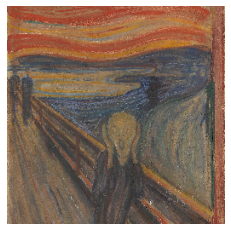

In [ ]:
# Select an image for the target style.
style_image = style_images['munch_scream']
#style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')  # Sligthly blur the style image
target_style = extract_style(style_image)

# We need the input shape to generate an initial random image to optimize.
input_shape = style_image.shape

# Plot target style image.
plt.imshow(style_image[0]); plt.axis('off');

We then initialize a random image and we process it through the same steps (`preprocess_input`, `content_extractor` and `gram_matrix`) to extract its style. We then optimize the random image (not the model weights!) so that its style becomes similar to the target style, by defining a mean square error loss on the styles.

100%|██████████| 1000/1000 [00:53<00:00, 18.76it/s]


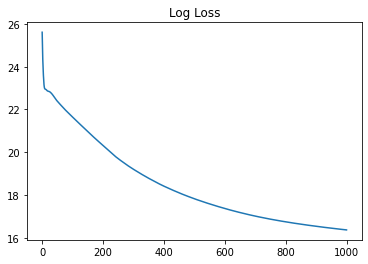

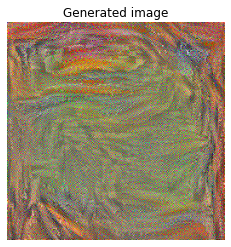

CPU times: user 33.8 s, sys: 1.2 s, total: 35 s
Wall time: 53.5 s


In [ ]:
%%time
from tqdm import tqdm
import numpy as np

EPOCHS = 1000
LEARNING_RATE = .02

# Select optimizer
opt = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.99, epsilon=1e-1)

# Since we work with float images, pixel values must be in range (0,1).
# We define a function to clip the pixel values in range (0,1).
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0., clip_value_max=1.0)

# Define a tf.Variable with a random initial image to optimize.
X = tf.Variable(tf.random.uniform(input_shape))

# Optimization loop
losses = []
for epoch in tqdm(range(EPOCHS)):
  # We use tf.GradientTape for automatic differentiation.
  # We want to optimize X, not the model parameters, hence we set
  # watch_accessed_variables=False to ignore all model parameters.
  with tf.GradientTape(watch_accessed_variables=False) as tape:
    # Watch the input tensor for gradient calculations
    tape.watch(X)
    # Extract style of X
    y = extract_style(X)
    # Calculate style loss
    loss = tf.reduce_mean(
      [tf.reduce_mean(tf.square(y[i] - target_style[i])) for i in range(len(target_style))]
    )
    losses.append(loss.numpy())
  # Take the gradient with respect to the input tensor
  grad = tape.gradient(loss, X)
  # Backprop
  opt.apply_gradients([(grad, X)])
  # Clip to keep pixel values in range
  X.assign(clip_0_1(X))

print()
plt.plot(np.log(losses)); plt.title("Log Loss"); plt.show();
print()
plt.imshow(X[0]); plt.title("Generated image"); plt.axis('off'); plt.show();

### Bringing Content and Style together

Helper functions to extract image content and style (same as before).

In [ ]:
def extract_content(img):
  # preprocess_input expects pixels in range [0, 255]
  X = preprocess_input(255.0 * img)
  y = content_extractor(X)
  return y

def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result / num_locations

def extract_style(img):
  # preprocess_input expects pixels in range [0, 255]
  X = preprocess_input(255.0 * img)
  Y = style_extractor(X)
  Y = [gram_matrix(style_output) for style_output in Y]
  return Y

We choose both a target content and a target style.

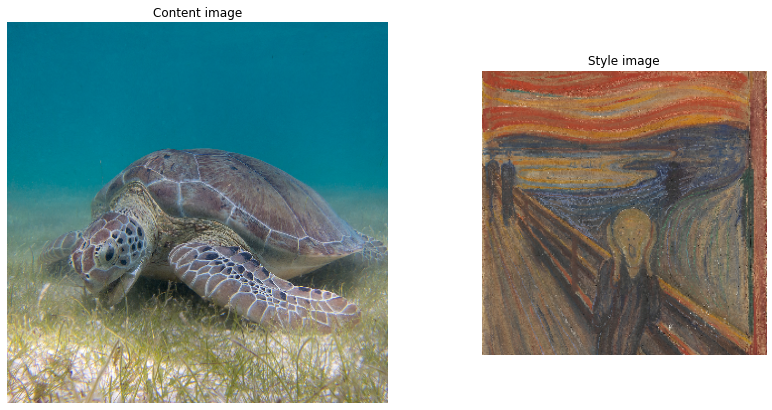

In [ ]:
# Select an image for the target content.
content_image = content_images['sea_turtle']
target_content = extract_content(content_image)

# Select an image for the target style.
style_image = style_images['munch_scream']
target_style = extract_style(style_image)

# Plot target content and style images.
show_n([content_image, style_image], ['Content image', 'Style image'])

We now want to minimize both the content and style losses. In order to replicate the target content and style at the same time, we use a weighted combination of the content and the style losses to get the total loss.

We define a helper function to calculate the total loss of an image, and a helper function for a single train step.

In [ ]:
def loss_fn(img, target_content, target_style):
  # Extract content and style of img
  y_content = extract_content(img)
  y_style = extract_style(img)
  # Calculate losses
  loss = dict(
    content = tf.reduce_mean(tf.square(y_content - target_content)),
    style = tf.reduce_mean(
    [tf.reduce_mean(tf.square(y_style[i] - target_style[i])) for i in range(len(target_style))])
  )
  # Define loss weights and sum up losses
  loss_weights = dict(content = 1e4, style = 1e-2)
  return sum(loss[c] * loss_weights[c] for c in loss.keys())


def train_step(img, target_content, target_style, optimizer):
  # We use tf.GradientTape for automatic differentiation.
  # We want to optimize X, not the model parameters, hence we set
  # watch_accessed_variables=False to ignore all model parameters.
  with tf.GradientTape(watch_accessed_variables=False) as tape:
    # Watch the input tensor for gradient calculations
    tape.watch(img)
    # Calculate the total loss of X
    loss = loss_fn(img, target_content, target_style)
  # Take the gradient with respect to the input tensor
  grad = tape.gradient(loss, img)
  # Backprop
  optimizer.apply_gradients([(grad, img)])
  # Clip to keep pixel values in range
  img.assign(clip_0_1(img))
  return loss

As before, we could start with a random image to optimize, but this would be slow. Our objective is to change the style of a content image to replicate a target style. Therefore, it make sense to start with the content image itself, and optimize it to match the target style. This makes the optimization process faster, and essentially it amounts to minimize the style loss while at the same time keeping the content loss low.

We define a helper function for the whole training process.

In [ ]:
from tqdm import tqdm
import numpy as np

# Since we work with float images, pixel values must be clipped in range (0,1).
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0., clip_value_max=1.0)

def transfer_style(
  content_image,
  style_image,
  epochs=10,
  steps_per_epoch=100,
  plot=True):

  # Calculate target content and target style.
  target_content = extract_content(content_image)
  target_style = extract_style(style_image)

  # Select optimizer.
  opt = tf.keras.optimizers.Adam(learning_rate=0.2, beta_1=0.99, epsilon=1e-1)

  # Define a tf.Variable to optimize, initialized to the target content image.
  image = tf.Variable(content_image)

  # Optimization loop
  losses, images = [], []
  for epoch in tqdm(range(epochs)):
    for step in range(steps_per_epoch):
      loss = train_step(image, target_content, target_style, opt)
    losses.append(loss.numpy())
    images.append(image.numpy())

  # Plot progress on loss and image
  if plot:
    print()
    plt.plot(np.log(losses)); plt.title("Log Loss"); plt.show();
    print()
    n = 4
    show_n(*map(list, zip(*([images[i], f"Epoch {i+1}"] for i in range(0, len(images), 1+len(images)//n)))))
  
  return images, losses

Do style transfer:

100%|██████████| 10/10 [02:58<00:00, 17.89s/it]

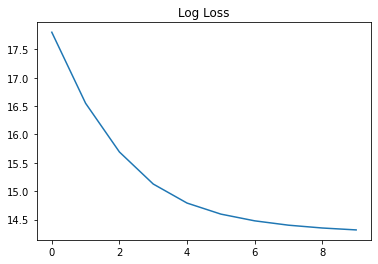

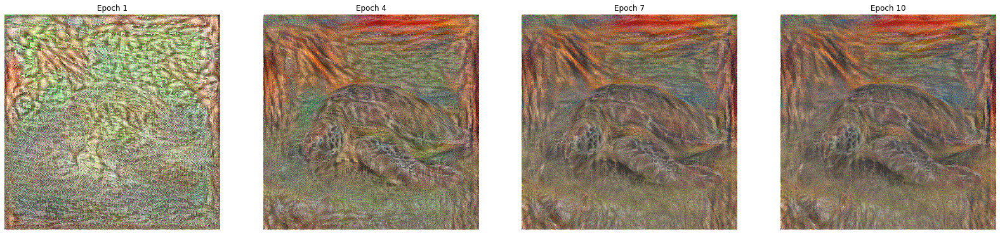

CPU times: user 56.3 s, sys: 4.73 s, total: 1min
Wall time: 2min 59s


In [ ]:
%%time
images, losses = transfer_style(content_image, style_image)

One downside to this basic implementation is that it produces a lot of high frequency artifacts.

We can decrease these by adding an explicit regularization term on the high frequency components of the image. In style transfer, this is called the total variation loss, and in TF it is already implemented in `tf.image.total_variation`.

We need to redefine the total loss by including the total variation loss and its weight.

In [ ]:
def loss_fn(img, target_content, target_style):
  # Extract content and style of img
  y_content = extract_content(img)
  y_style = extract_style(img)
  # Calculate loss
  loss = dict(
    content = tf.reduce_mean(tf.square(y_content - target_content)),
    style = tf.reduce_mean(
    [tf.reduce_mean(tf.square(y_style[i] - target_style[i])) for i in range(len(target_style))]),
    variation = tf.image.total_variation(img)
  )
  # Define loss weights and sum up losses
  loss_weights = dict(content = 1e4, style = 1e-2, variation = 30)
  return sum(loss[c] * loss_weights[c] for c in loss.keys())

Do style transfer including the total variation loss:

100%|██████████| 10/10 [03:00<00:00, 18.10s/it]

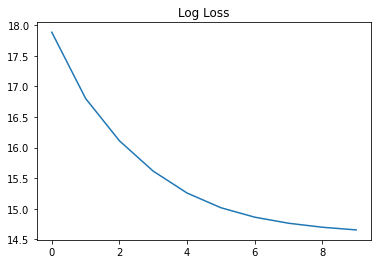

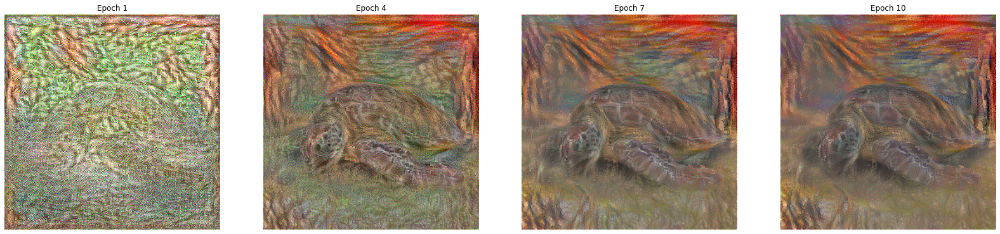

CPU times: user 59.3 s, sys: 4.44 s, total: 1min 3s
Wall time: 3min 1s


In [ ]:
%%time
images, losses = transfer_style(content_image, style_image)

## Build a model for style transfer

In building the model, we use the same 5 conv layers to extract the features map for content and style. For style we apply the gram matrix to each feature map, and for content we apply weights to each feature map, to control the relative importance.

For example, a content weight vector `[0,0,0,0,1]` selects only the latest feature map with more abstract features, and results in a more abstract output, while `[1,0,0,0,0]` results is a less distorted image. The weights are relative, and are normalised such that the sum of squared weights equal 5 (so that the loss function takes the mean of squares).

In [ ]:
# @title Define `StyleTransferModel`

from tqdm import tqdm
import numpy as np
import tensorflow as tf

class StyleTransferModel(tf.keras.Model):

  def __init__(self, content_layer_weights=[0, 1, 1, 1, 0]):
    super().__init__()
    self.vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
    self.vgg.trainable = False
    self.preprocess_input = tf.keras.applications.vgg19.preprocess_input
    self.conv_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1',
                         'block4_conv1', 'block5_conv1']
    self.feature_extractor = tf.keras.Model(
      self.vgg.input, [self.vgg.get_layer(name).output for name in self.conv_layers])
    self._set_content_layer_weights(content_layer_weights)

  def _set_content_layer_weights(self, content_layer_weights):
    assert(len(content_layer_weights) == len(self.conv_layers))
    # Normalize the content weights with their root mean of squares.
    rms = np.sqrt(sum([w*w for w in content_layer_weights]) / len(content_layer_weights))
    self.content_layer_weights = [w/rms for w in content_layer_weights]

  def _gram_matrix(self, input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result / num_locations

  def extract_features(self, img):
    # Combine content and style extraction
    X = self.preprocess_input(255.0 * img)
    y = self.feature_extractor(X)
    content = [feature * self.content_layer_weights[i] for i,feature in enumerate(y)]
    style = [self._gram_matrix(feature) for feature in y]
    return content, style

  def call(self, img):
    return self.extract_features(img)

  def _loss_fn(self, img, target_content, target_style, loss_weights):
    # Extract content and style of img.
    y_content, y_style = self.extract_features(img)
    # Calculate losses.
    loss = dict(
      content = tf.reduce_mean(
        [tf.reduce_mean(tf.square(y_content[i] - target_content[i])) for i in range(len(target_content))]),
      style = tf.reduce_mean(
        [tf.reduce_mean(tf.square(y_style[i] - target_style[i])) for i in range(len(target_style))]),
      variation = tf.image.total_variation(img)
    )
    # Sum up losses according to their weights
    return sum(loss[c] * loss_weights[c] for c in loss.keys())

  def _train_step(self, img, target_content, target_style, optimizer, loss_weights):
    # We use tf.GradientTape for automatic differentiation.
    # We want to optimize X, not the model parameters, hence we set
    # watch_accessed_variables=False to ignore all model parameters.
    with tf.GradientTape(watch_accessed_variables=False) as tape:
      # Watch the input tensor for gradient calculations.
      tape.watch(img)
      # Calculate the total loss.
      loss = self._loss_fn(img, target_content, target_style, loss_weights)
    # Take the gradient with respect to the input tensor.
    grad = tape.gradient(loss, img)
    # Backprop.
    optimizer.apply_gradients([(grad, img)])
    # Clip pixel values in range (0,1).
    img.assign(tf.clip_by_value(img, clip_value_min=0., clip_value_max=1.0))
    return loss

  def transfer_style(self,
    content_image,
    style_image,
    epochs=10,
    steps_per_epoch=100,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.2, beta_1=0.99, epsilon=1e-1),
    loss_weights=dict(content=1e4, style=1e-2, variation=30),
    content_layer_weights=None,
    plot=True):
    # Update the content weights if they are specified.
    if content_layer_weights:
      self._set_content_layer_weights(content_layer_weights)
    # Calculate target content and target style.
    target_content, _ = self.extract_features(content_image)
    _, target_style = self.extract_features(style_image)
    # Define a tf.Variable to optimize, initialized to the target content image.
    image = tf.Variable(content_image)
    # Optimization loop
    losses, images = [], []
    for epoch in tqdm(range(epochs)):
      for step in range(steps_per_epoch):
        loss = self._train_step(image, target_content, target_style, optimizer, loss_weights)
      losses.append(loss.numpy())
      images.append(image.numpy())
    # Plot progress on loss and image
    if plot:
      print()
      plt.plot(np.log(losses)); plt.title("Log Loss"); plt.show();
      print()
      n = 4
      show_n(*map(list, zip(*([images[i], f"Epoch {i+1}"] for i in range(0, len(images), 1+len(images)//n)))))
    return images, losses


100%|██████████| 10/10 [02:12<00:00, 13.28s/it]


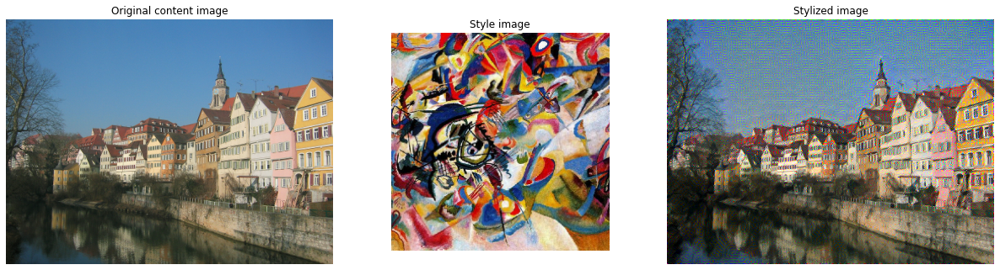

In [ ]:
#@title Use `StyleTransferModel`  { display-mode: "form" }

content_name = 'tuebingen'  # @param ['sea_turtle', 'tuebingen', 'grace_hopper']
style_name = 'kandinsky_composition_7'  # @param ['kanagawa_great_wave', 'kandinsky_composition_7', 'hubble_pillars_of_creation', 'van_gogh_starry_night', 'turner_nantes', 'munch_scream', 'picasso_demoiselles_avignon', 'picasso_violin', 'picasso_bottle_of_rum', 'fire', 'derkovits_woman_head', 'amadeo_style_life', 'derkovtis_talig', 'amadeo_cardoso', 'kandinsky_murnau_dorfstrasse']
content_image = content_images[content_name]
style_image = style_images[style_name]

painter = StyleTransferModel()
images, losses = painter.transfer_style(content_image, style_image, plot=False)
stylized_image = images[-1]

show_n([content_image, style_image, stylized_image],
       titles=['Original content image', 'Style image', 'Stylized image'])

## Mira

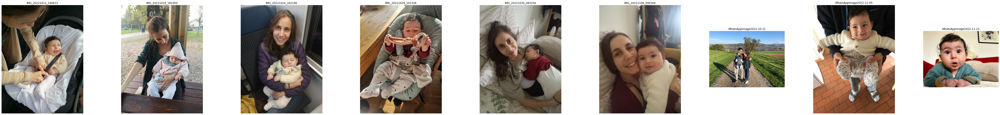

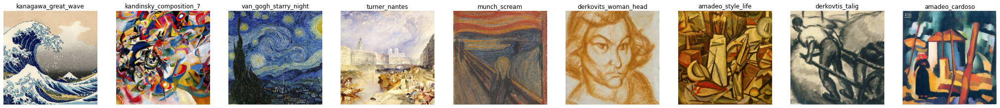

In [ ]:
# Select pics as content images.
input_folder = '/content/mira'
if not os.path.isdir(input_folder):
  os.mkdir(input_folder)
load_size = (512,384)  # try with (1024,768)
pic_names = [
  'IMG_20221012_140633',
  'IMG_20221018_181950',
  'IMG_20221024_162106',
  'IMG_20221029_101326',
  'IMG_20221030_083256',
  'IMG_20221106_090304',
  'WhatsAppImage2022-10-31',
  'WhatsAppImage2022-11-05',
  'WhatsAppImage2022-11-22'
]
pics = {pic_name: load_image(
  os.path.join(input_folder, pic_name+'.jpg'),
  image_size=load_size) for pic_name in pic_names}

# Select paintings as style images.
styles = [
  'kanagawa_great_wave',
  'kandinsky_composition_7',
  'van_gogh_starry_night',
  'turner_nantes',
  'munch_scream',
  'derkovits_woman_head',
  'amadeo_style_life',
  'derkovtis_talig',
  'amadeo_cardoso'
  ]
target_style_images = {style: style_images[style] for style in styles}
assert(len(pics) == len(styles))

# Plot target content and style images.
show_n(list(pics.values()), list(pics.keys()))
show_n(list(target_style_images.values()), list(target_style_images.keys()))

Apply the styles to the pics:

In [ ]:
%%time
painter = StyleTransferModel()
stylized_pics = dict()
for pic_name, style in zip(pic_names, styles):
  print(f"Applying {style} to {pic_name} ... ")
  images, losses = painter.transfer_style(
    pics[pic_name],
    target_style_images[style],
    epochs=5,
    plot=False)
  stylized_pics[pic_name+"_"+style] = images[-1]

Save and download image files

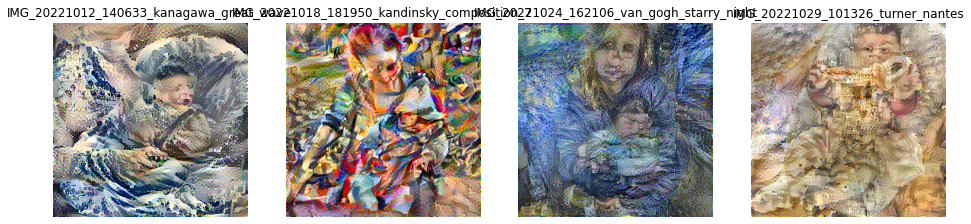

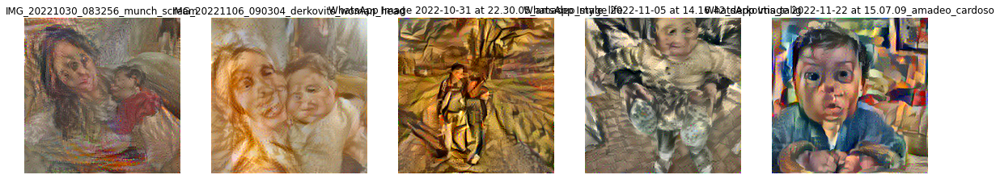

In [ ]:
n_imgs = len(stylized_pics)
show_n(list(stylized_pics.values()), list(stylized_pics.keys()), nrows=3)

from google.colab import files
input_folder = '/content/mira'
for name, image in stylized_pics.items():
  path = os.path.join(input_folder, name+'.jpg')
  tensor_to_image(image).save(path)
  files.download(path)

Select one image and reprocess it with different content layer and loss weights.

Applying amadeo_cardoso to IMG_20221018_181950 ... 
	content_loss_weight=1000, content_layer_weights=[0,1,1,1,0] ... 


100%|██████████| 60/60 [12:44<00:00, 12.74s/it]


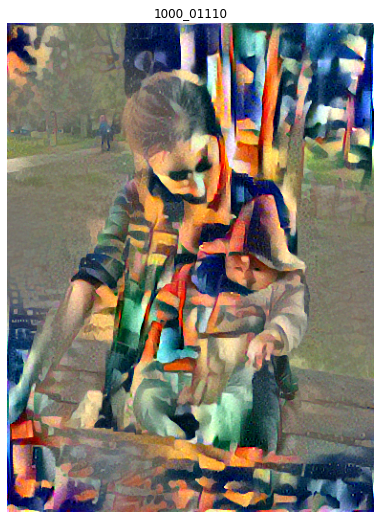

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CPU times: user 4min 23s, sys: 16.2 s, total: 4min 39s
Wall time: 12min 45s


In [ ]:
%%time

input_folder = '/content/mira'
pic_name, style = 'IMG_20221018_181950', 'amadeo_cardoso'

# Output folder
stylized_pic_name = pic_name+"_"+style
output_folder =  os.path.join(input_folder, stylized_pic_name)
if not os.path.isdir(output_folder):
  os.mkdir(output_folder)

# Initialize the model
painter = StyleTransferModel()
epochs = 60

# Hyperparameter grids
content_loss_weight_grid = [1000]
content_layer_weights_grid = [[0,1,1,1,0]]

# Hyperparameter grid search
print(f"Applying {style} to {pic_name} ... ")
results = dict(titles=[], images=[])
for content_loss_weight in content_loss_weight_grid:
  for content_layer_weights in content_layer_weights_grid:
    # Process
    print(f"\tcontent_loss_weight={content_loss_weight}, content_layer_weights=[{','.join(str(i) for i in content_layer_weights)}] ... ")
    images, losses = painter.transfer_style(
      pics[pic_name],
      style_images[style],
      epochs=epochs,
      loss_weights=dict(content=1e2, style=1e-2, variation=30),
      content_layer_weights=[0, 0, 0, 0, 1],
      plot=False)
    # Store last image
    parameter_tag = str(content_loss_weight)+'_'+''.join(str(i) for i in content_layer_weights)
    results["titles"].append(parameter_tag)
    results["images"].append(images[-1])
    # Save last image
    path = os.path.join(output_folder, stylized_pic_name+'_'+parameter_tag+'.jpg')
    tensor_to_image(images[-1]).save(path)
    # Save images from all epochs
    parameter_folder = os.path.join(output_folder, parameter_tag)
    if not os.path.isdir(parameter_folder):
      os.mkdir(parameter_folder)
    for i,img in enumerate(images):
      path = os.path.join(parameter_folder, stylized_pic_name+'_'+parameter_tag+'_'+str(i+1)+'.jpg')
      tensor_to_image(img).save(path)

# Plot
show_n(results["images"], results["titles"], ncols=4)

# Zip and download
!zip -qr {output_folder + '.zip'} {output_folder}
from google.colab import files
files.download(output_folder + '.zip')